<a href="https://colab.research.google.com/github/nuna-aa/Vision-Interpretability/blob/part3-dataset-exemplars/Dataset_Exemplar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Network Feature Visualization and Dataset Exemplars


---



# **Introduction**
This notebook implements a comprehensive investigation into neural network interpretability using the InceptionV1 architecture. The experiment combines two powerful techniques:

1. Feature optimization using gradient ascent to synthesize inputs that maximally activate specific neurons, and
2. Dataset exemplar identification to find real-world images that naturally trigger strong neural responses. The methodology follows principles from Distill.pub's neural network interpretability research, creating visualizations that reveal what individual neurons have learned to detect.

# **Experimental Overview**
The experiment analyzes 10 neurons in the mixed4a layer of InceptionV1, a convolutional neural network trained on ImageNet. For each neuron, the code generates four types of visualizations: negative optimizations (patterns that minimize activation), minimum-activation dataset examples, maximum-activation dataset examples, and positive optimizations (patterns that maximize activation).


**Block 1: Environment Setup**


In [2]:
!pip install torch-lucent

**Purpose:** Installs the Lucent library, a PyTorch-based toolkit for neural network interpretability and feature visualization. Lucent provides tools for generating optimized images that activate specific neurons through gradient ascent.

**Block 2: Library Imports**

In [3]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from datasets import load_dataset
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn.functional as F
from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo import inceptionv1

**Purpose:** Imports essential libraries:
​

**PyTorch (torch):** Deep learning framework for tensor operations and neural network execution

**torchvision:** Provides image preprocessing utilities and model architectures

**Lucent modules:**

**render:** Generates optimized visualizations via gradient ascent

**objectives:** Defines optimization targets (which neurons to maximize/minimize)

**inceptionv1:** Pre-trained InceptionV1 model

**datasets:** HuggingFace library for loading ImageNet

**matplotlib:** Visualization and plotting

**tqdm:** Progress bar for batch processing



**Block 3: Device Configuration**


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if device.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: Tesla T4


**What's Happening:** Detects available hardware acceleration. The code attempts to use CUDA-enabled GPUs (Tesla T4 in this case) for faster computation, falling back to CPU if unavailable. GPU acceleration is crucial because the experiment processes thousands of images and performs gradient-based optimization, both computationally intensive tasks.

**Block 4: Model Loading**

In [5]:
model = inceptionv1(pretrained=True)
model = model.to(device)
model.eval()

InceptionV1(
  (conv2d0_pre_relu_conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2))
  (conv2d1_pre_relu_conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (conv2d2_pre_relu_conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1))
  (mixed3a_1x1_pre_relu_conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_3x3_bottleneck_pre_relu_conv): Conv2d(192, 96, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_5x5_bottleneck_pre_relu_conv): Conv2d(192, 16, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_pool_reduce_pre_relu_conv): Conv2d(192, 32, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_3x3_pre_relu_conv): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
  (mixed3a_5x5_pre_relu_conv): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (mixed3b_1x1_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
  (mixed3b_3x3_bottleneck_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
  (mixed3b_5x5_bottleneck_pre_relu_conv): Conv2d(256, 32, 

**Purpose:** Loads the pre-trained InceptionV1 model and prepares it for inference:
​

**inceptionv1(pretrained=True):** Downloads weights trained on ImageNet-1k (1.28M images, 1000 classes)
​

**.to(device):** Moves model parameters to GPU memory

**.eval():** Sets the model to evaluation mode, disabling dropout and batch normalization updates for deterministic behavior

**Architecture Details:** InceptionV1 uses "inception modules" that apply multiple convolutional filters of different sizes in parallel, allowing the network to capture features at multiple scales. The mixed4a layer (targeted in this experiment) is an intermediate layer that detects mid-level features like textures, patterns, and object parts.

# PART 1: Feature Optimization with Lucent


**Block 5-6: Initialization**

In [6]:
print("=" * 60)
print("PART 1: Generating Feature Optimizations with Lucent")
print("=" * 60)

PART 1: Generating Feature Optimizations with Lucent


In [7]:
# ============================================================================
# CONFIGURATION
# ============================================================================
num_neurons = 10
positive_optimizations = []
negative_optimizations = []

**Purpose:** Initializes data structures to store optimized images. The experiment will generate 20 total optimizations (10 positive + 10 negative) for neurons 0-9 in layer mixed4a.
​

**Block 7:** Feature Optimization Loop

In [8]:
for neuron_idx in range(num_neurons):
    print(f"\nOptimizing neuron {neuron_idx}...")

    # Positive optimization (maximize activation)
    print(f"  Generating positive optimization...")
    pos_result = render.render_vis(
        model,
        f"mixed4a:{neuron_idx}",  # Target layer and channel
        thresholds=[512],  # Number of optimization steps
        show_inline=False
    )
    pos_img = pos_result[0][0]  # Get the optimized image
    positive_optimizations.append(pos_img)

    # Negative optimization (minimize activation)
    print(f"  Generating negative optimization...")
    neg_result = render.render_vis(
        model,
        -objectives.channel(f"mixed4a", neuron_idx),  # Negative objective
        thresholds=[512],
        show_inline=False
    )
    neg_img = neg_result[0][0]
    negative_optimizations.append(neg_img)



Optimizing neuron 0...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 35.26it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:13<00:00, 37.45it/s]



Optimizing neuron 1...
  Generating positive optimization...


100%|██████████| 512/512 [00:13<00:00, 37.29it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:13<00:00, 37.27it/s]



Optimizing neuron 2...
  Generating positive optimization...


100%|██████████| 512/512 [00:13<00:00, 37.23it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:13<00:00, 37.14it/s]



Optimizing neuron 3...
  Generating positive optimization...


100%|██████████| 512/512 [00:13<00:00, 36.97it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:13<00:00, 36.58it/s]



Optimizing neuron 4...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 36.35it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:14<00:00, 35.53it/s]



Optimizing neuron 5...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 36.02it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:13<00:00, 36.62it/s]



Optimizing neuron 6...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 36.35it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:14<00:00, 36.21it/s]



Optimizing neuron 7...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 35.82it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:14<00:00, 36.32it/s]



Optimizing neuron 8...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 35.94it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:14<00:00, 35.51it/s]



Optimizing neuron 9...
  Generating positive optimization...


100%|██████████| 512/512 [00:14<00:00, 35.45it/s]


  Generating negative optimization...


100%|██████████| 512/512 [00:14<00:00, 35.78it/s]


**What's Happening:** This is the core of feature optimization, a technique that synthesizes input images to understand what patterns activate specific neurons.
​

**Positive Optimization Process:**

Starts with random noise as input image

Performs 1024 steps of gradient ascent to maximize the activation of **mixed4a:neuron_idx**

**In each step:**

**Forward pass:** Compute neuron activation for current input

**Backward pass:** Calculate gradients of activation with respect to input pixels

**Update input:** Move pixels in direction that increases activation

**Result:** A synthetic image showing the "preferred stimulus" of the neuron

**Negative Optimization (via -objectives.channel):** Same process but minimizes activation to reveal patterns the neuron "avoids" or suppresses.
​

**Technical Details:**

**thresholds=[512]:** Number of optimization iterations

**show_inline=False:** Suppresses inline display during generation

**Regularization (implicit in Lucent):** Applies techniques like total variation regularization and jitter to produce natural-looking images rather than adversarial noise

**Output:** After ~3 seconds per neuron, generates pairs of optimized images. For example, neuron 0 might show maximum activation for diagonal textures (positive) and minimum for vertical lines (negative).

# PART 2: Finding Dataset Exemplars

**Block 8-10:** Dataset Configuration

In [9]:
print("\n" + "=" * 60)
print("PART 2: Finding Dataset Exemplars")
print("=" * 60)


PART 2: Finding Dataset Exemplars


In [10]:
# ============================================================================
# SETUP MODEL AND HOOKS
# ============================================================================
model = model.to(device)

In [11]:
batch_size = 128
max_samples = None  # Change to None for full dataset
split = 'validation'

**Purpose:** Configures parameters for processing real ImageNet images:
​

**batch_size=128:** Processes 128 images simultaneously for efficiency

**max_samples=None:** Processes entire training set (**1.28M** images)

**split='train':** Uses ImageNet training split

**Block 11:** Image Preprocessing

In [12]:
# ============================================================================
# PREPROCESSING
# ============================================================================
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

**Purpose:** Defines standard ImageNet preprocessing pipeline:
​

**Resize(256):** Resizes shortest edge to 256 pixels

**CenterCrop(224):** Extracts 224×224 center region (InceptionV1 input size)

**ToTensor():** Converts PIL Image to PyTorch tensor (C×H×W format, values )
​

**Normalize:** Applies ImageNet statistics to standardize color channels:

**Mean:** [0.485, 0.456, 0.406] (R,G,B)

**Std:** [0.229, 0.224, 0.225]

This normalization matches the preprocessing used during InceptionV1 training, ensuring consistent feature representations

**Block 12-13:** Activation Hook Setup

In [13]:
activations = {}

def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

**What's Happening:** Implements a forward hook to capture intermediate layer activations:
​

**Forward hook:** PyTorch callback that executes during forward pass

**get_activation:** Factory function that creates hooks for specific layers

**activations dict:** Stores captured tensors

**output.detach():** Removes gradients from tensor (saves memory, we only need values)

**Purpose:** Normally, PyTorch only returns final model output. The hook intercepts activations at mixed4a (shape: [batch, 508, 14, 14] = batch size × 508 channels × 14×14 spatial dimensions).

**Block 14-15:** Dataset Loading

In [14]:
handle = model.mixed4a.register_forward_hook(get_activation('mixed4a'))

In [15]:
from datasets import load_dataset
from huggingface_hub import login

login()

In [16]:
# ============================================================================
# LOAD DATASET
# ============================================================================
print(f"Loading ImageNet-1k {split} split with streaming...")
dataset = load_dataset('imagenet-1k', split=split, streaming=True)


Loading ImageNet-1k validation split with streaming...


Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

**Purpose:** Loads ImageNet-1k using HuggingFace's streaming API:
​

**streaming=True:** Downloads images on-the-fly rather than all at once (critical for 138GB dataset)

**login():** Authenticates for dataset access (ImageNet requires agreement to terms)

**Output:** Progress bars show "Resolving data files: 294/294" (294 shard files)

**Block 16:** Data Structure Initialization: Min-Heap for Top-K Tracking

| Parameter      | Value                 | Justification                                        |
| -------------- | --------------------- | ---------------------------------------------------- |
| Pooling        | Global Average (mean) | Robust, holistic, standard practice                  |
| Batch size     | 128                   | GPU utilization, memory safety                       |
| Top-k          | 10                    | Sufficient for pattern recognition, memory efficient |
| Data structure | Min-heap              | O(log k) updates, streaming-compatible               |
| Image storage  | In-heap               | Required for streaming, minimal overhead (30 MB)     |
| Cache clearing | Every 100 batches     | Balances memory management with performance          |
| Min tracking   | Negation              | Standard Python heapq pattern for max-heap behavior  |

**Rationale:**
We use Python's heapq min-heap structure to maintain the top-k activations efficiently:

**Memory efficiency:** Instead of storing all 50,000 activation values and sorting them post-hoc, heaps maintain only the top-k elements **(k=10)** per neuron. This reduces memory footprint from O(n×neurons) to O(k×neurons), critical when processing large datasets.

**Time complexity:** Heap operations (insertion, replacement) are O(log k), making updates efficient during streaming. Sorting all n samples would require O(n log n) per neuron.

**Streaming compatibility:** Heaps enable single-pass processing without requiring the entire dataset to fit in memory, essential for large-scale datasets or limited computational resources.

**Heap mechanics:**

**Maximum activations:** Standard min-heap keeps the smallest of the top-k at position . When a new activation exceeds this minimum, we replace it via heapreplace().

**Minimum activations:** We store negated values, transforming the min-heap into a max-heap. The element at represents the largest actual value in our bottom-k collection, which we replace when finding smaller activations.

**GPU utilization:** Batch size 128 provides good GPU occupancy for inference on modern GPUs (e.g., V100, A100), balancing throughput with memory constraints.

**Memory constraints:** Larger batches risk OOM errors when combined with the activation extraction, image storage, and model parameters. 128 is a conservative choice that remains stable across different hardware.

**Streaming compatibility:** Smaller batches reduce latency in streaming scenarios where images arrive sequentially, allowing periodic heap updates without accumulating excessive data.

In [30]:

# ============================================================================
# INITIALIZE DATA STRUCTURES (MEMORY-EFFICIENT HEAPS)
# ============================================================================
max_heaps = [[] for _ in range(num_neurons)]  # Top-k maximum activations
min_heaps = [[] for _ in range(num_neurons)]  # Top-k minimum activations

# Batch accumulators
total_processed = 0
batch_images = []
batch_tensors = []
batch_ids = []

batch_size = 128
max_samples = None  # Set to a number to limit processing (e.g., 10000)
top_k = 10  # Number of top/bottom activations to keep per neuron

**Block 17:** Main Processing Loop (Most Complex Block)

**Image Storage Strategy:** In-Heap Storage

**Implementation:**


```
heapq.heappush(max_heaps[neuron_idx],
             (act_val, img_id, batch_images[i].copy()))
```


**Rationale:**
We store image copies directly in the heap rather than just image IDs:

**Streaming dataset compatibility: **The dataset uses streaming=True, which prevents random access by index. Storing images at processing time is the only way to retrieve them later for visualization.

**Memory footprint:** With k=10 images per neuron for both max and min, we store only 200 images total (10 neurons × 10 max × 10 min × 2 = 200 images ≈ 30 MB), which is negligible compared to model and batch memory.

**Visualization efficiency:** Images are immediately available for plotting without re-iterating through the dataset, significantly speeding up the visualization phase.

**Alternative (not used):** Storing only IDs would require either:

**Non-streaming dataset** (loads all 50K images into memory = 7.5 GB)

**Re-streaming the dataset** to collect images (slow, requires dataset re-iteration)

**Memory Management:** Periodic Cache Clearing
Implementation:

```
if torch.cuda.is_available() and total_processed % 12800 == 0:
    torch.cuda.empty_cache()
```

**Rationale:**

**Frequency:** Clearing every 12,800 samples (every 100 batches) balances memory management with performance. More frequent clearing (every batch) adds significant overhead, while less frequent clearing risks fragmentation.

**GPU memory fragmentation:** PyTorch's caching allocator can fragment GPU memory over time. Periodic clearing helps the allocator reorganize and reclaim unused blocks.

**Minimal overhead:** Calling empty_cache() every 100 batches adds negligible latency compared to clearing every batch (which can add 2-30 seconds per call).

In [18]:
import heapq

# ============================================================================
# PROCESS IMAGES
# ============================================================================
for idx, sample in enumerate(tqdm(dataset, desc="Processing images")):
    try:
        # Get image from sample
        image = sample['image']

        if image.mode != 'RGB':
            image = image.convert('RGB')

        # Apply preprocessing
        tensor = preprocess(image)

        # Add to batch
        batch_images.append(image.copy())  # Keep original image
        batch_tensors.append(tensor)
        batch_ids.append(idx)

        # Process batch when full
        if len(batch_tensors) >= batch_size:
            # Stack and move to device
            batch_tensor = torch.stack(batch_tensors).to(device)

            # Forward pass
            with torch.no_grad():
                _ = model(batch_tensor)

            # Get activations
            mixed4a_output = activations['mixed4a'].detach().cpu()
            all_activations = mixed4a_output.mean(dim=[2, 3])  # (batch_size, num_neurons)
            activations_np = all_activations.numpy()

            # Update heaps for each neuron
            for neuron_idx in range(num_neurons):
                for i, img_id in enumerate(batch_ids):
                    act_val = float(activations_np[i, neuron_idx])

                    # TOP-K MAXIMUM
                    if len(max_heaps[neuron_idx]) < top_k:
                        heapq.heappush(max_heaps[neuron_idx],
                                     (act_val, img_id, batch_images[i].copy()))
                    elif act_val > max_heaps[neuron_idx][0][0]:
                        heapq.heapreplace(max_heaps[neuron_idx],
                                        (act_val, img_id, batch_images[i].copy()))

                    # TOP-K MINIMUM
                    if len(min_heaps[neuron_idx]) < top_k:
                        heapq.heappush(min_heaps[neuron_idx],
                                     (-act_val, img_id, batch_images[i].copy()))
                    elif -act_val > min_heaps[neuron_idx][0][0]:
                        heapq.heapreplace(min_heaps[neuron_idx],
                                        (-act_val, img_id, batch_images[i].copy()))

            total_processed += len(batch_tensors)

            # Memory cleanup - CRITICAL with streaming!
            del batch_tensor, mixed4a_output, all_activations, activations_np
            batch_images.clear()  # Clear batch images
            batch_tensors.clear()
            batch_ids.clear()

            if torch.cuda.is_available() and total_processed % 12800 == 0:
                torch.cuda.empty_cache()

    except Exception as e:
        print(f"Warning: Skipping sample {idx}: {e}")
        continue

# ============================================================================
# PROCESS REMAINING SAMPLES
# ============================================================================
if batch_tensors:
    batch_tensor = torch.stack(batch_tensors).to(device)

    with torch.no_grad():
        _ = model(batch_tensor)

    mixed4a_output = activations['mixed4a'].detach().cpu()
    all_activations = mixed4a_output.mean(dim=[2, 3])
    activations_np = all_activations.numpy()

    for neuron_idx in range(num_neurons):
        for i, img_id in enumerate(batch_ids):
            act_val = float(activations_np[i, neuron_idx])

            if len(max_heaps[neuron_idx]) < top_k:
                heapq.heappush(max_heaps[neuron_idx],
                             (act_val, img_id, batch_images[i].copy()))
            elif act_val > max_heaps[neuron_idx][0][0]:
                heapq.heapreplace(max_heaps[neuron_idx],
                                (act_val, img_id, batch_images[i].copy()))

            if len(min_heaps[neuron_idx]) < top_k:
                heapq.heappush(min_heaps[neuron_idx],
                             (-act_val, img_id, batch_images[i].copy()))
            elif -act_val > min_heaps[neuron_idx][0][0]:
                heapq.heapreplace(min_heaps[neuron_idx],
                                (-act_val, img_id, batch_images[i].copy()))

    total_processed += len(batch_tensors)

Processing images: 50000it [43:16, 19.26it/s]


Activation Negation for Minimum Tracking
Implementation: **bold text**

```
heapq.heappush(min_heaps[neuron_idx], (-act_val, img_id, img))
elif -act_val > min_heaps[neuron_idx][0][0]:
    heapq.heapreplace(min_heaps[neuron_idx], (-act_val, img_id, img))
```

**Rationale:**
Python's heapq implements only min-heaps. To track minimum activations:

**Negation trick:** Storing negated values (-act_val) transforms the min-heap into a max-heap. The most negative value (representing the largest actual activation) sits at , which is precisely the element we want to replace when finding smaller activations.

**Comparison logic:** The condition -act_val > heap[0][0] correctly identifies when a new activation is smaller than the current largest in our bottom-k collection.

**Post-processing:** During finalization, we un-negate values: `[(-val, img_id, img) for val, img_id, img in top_min]` to restore actual activation magnitudes for reporting.

In [19]:
# ============================================================================
# FINALIZE RESULTS
# ============================================================================
print("\nFinalizing results...")

final_max_activations = []
final_min_activations = []

for neuron_idx in range(num_neurons):
    # Get top-k maximum (sorted highest first)
    top_max = heapq.nlargest(top_k, max_heaps[neuron_idx])
    final_max_activations.append(top_max)

    # Get top-k minimum (sorted lowest first)
    top_min = heapq.nlargest(top_k, min_heaps[neuron_idx])
    top_min = [(-val, img_id, img) for val, img_id, img in top_min]
    top_min.sort()
    final_min_activations.append(top_min)

# Clean up
max_heaps.clear()
min_heaps.clear()
handle.remove()

print(f"\nProcessed {total_processed} images")
print(f"Stored {num_neurons * top_k * 2} total images in memory")


Finalizing results...

Processed 50000 images
Stored 200 total images in memory


In [20]:
# ============================================================================
# PRINT RESULTS
# ============================================================================
for neuron_idx in range(num_neurons):
    print(f"\n{'='*70}")
    print(f"NEURON {neuron_idx}")
    print(f"{'='*70}")

    print(f"\nTop-{top_k} MAXIMUM activations:")
    for rank, (act_val, img_id, img) in enumerate(final_max_activations[neuron_idx], 1):
        print(f"  Rank {rank}: Image {img_id}, Activation = {act_val:.4f}")

    print(f"\nTop-{top_k} MINIMUM activations:")
    for rank, (act_val, img_id, img) in enumerate(final_min_activations[neuron_idx], 1):
        print(f"  Rank {rank}: Image {img_id}, Activation = {act_val:.4f}")


NEURON 0

Top-10 MAXIMUM activations:
  Rank 1: Image 2715, Activation = 166.1890
  Rank 2: Image 325, Activation = 159.4434
  Rank 3: Image 28289, Activation = 158.8553
  Rank 4: Image 36659, Activation = 139.1115
  Rank 5: Image 47199, Activation = 135.7444
  Rank 6: Image 41147, Activation = 134.9366
  Rank 7: Image 1307, Activation = 132.2977
  Rank 8: Image 2267, Activation = 131.3979
  Rank 9: Image 18124, Activation = 130.9822
  Rank 10: Image 47625, Activation = 129.8737

Top-10 MINIMUM activations:
  Rank 1: Image 683, Activation = 0.0000
  Rank 2: Image 2705, Activation = 0.0000
  Rank 3: Image 5003, Activation = 0.0000
  Rank 4: Image 7163, Activation = 0.0000
  Rank 5: Image 10115, Activation = 0.0000
  Rank 6: Image 11338, Activation = 0.0000
  Rank 7: Image 15610, Activation = 0.0000
  Rank 8: Image 18450, Activation = 0.0000
  Rank 9: Image 21548, Activation = 0.0000
  Rank 10: Image 22631, Activation = 0.0000

NEURON 1

Top-10 MAXIMUM activations:
  Rank 1: Image 46580

In [24]:
def get_top_images_for_neuron(neuron_idx, dataset, activation_type='max'):
    """
    Retrieve top-k images for a specific neuron.

    Args:
        neuron_idx: Index of the neuron
        dataset: Dataset object (not needed - images stored in heap)
        activation_type: 'max' or 'min'

    Returns:
        List of dicts with 'image', 'activation', and 'id' keys
    """
    if activation_type == 'max':
        activations_list = final_max_activations[neuron_idx]
    else:
        activations_list = final_min_activations[neuron_idx]

    result = []
    for activation_val, img_id, img in activations_list:
        result.append({
            'image': img,
            'activation': activation_val,
            'id': img_id
        })

    return result


def get_image_by_id(dataset, img_id):
    """
    Retrieve image by ID from the heaps (not from dataset).
    This is needed only if you don't store images in heaps.
    """
    # Since images are stored in heaps, search there
    for neuron_idx in range(num_neurons):
        # Check max heaps
        for act_val, id_, img in final_max_activations[neuron_idx]:
            if id_ == img_id:
                return img
        # Check min heaps
        for act_val, id_, img in final_min_activations[neuron_idx]:
            if id_ == img_id:
                return img
    return None


# PART 3: Creating Comprehensive Visualizations

**Design:**
The visualization follows the Distill.pub convention:

4-panel layout: `[Negative Opt | Min Examples | Max Examples | Positive Opt]`

**3×3 grids:** Display 9 examples per category to show consistency in neuron response patterns

**Activation annotations:** Values below each image enable quantitative assessment

**Rationale:**

**Pattern recognition:** Multiple examples reveal whether a neuron consistently detects a specific feature (e.g., dogs, textures) or responds to diverse stimuli.

**Comparative analysis:** Side-by-side max and min examples highlight what activates vs. suppresses the neuron.



In [25]:
print("\n" + "=" * 60)
print("PART 3: Creating Comprehensive Visualization")
print("=" * 60)


PART 3: Creating Comprehensive Visualization


Creating Distill-style visualizations...


/tmp/ipython-input-2792603833.py:127: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])


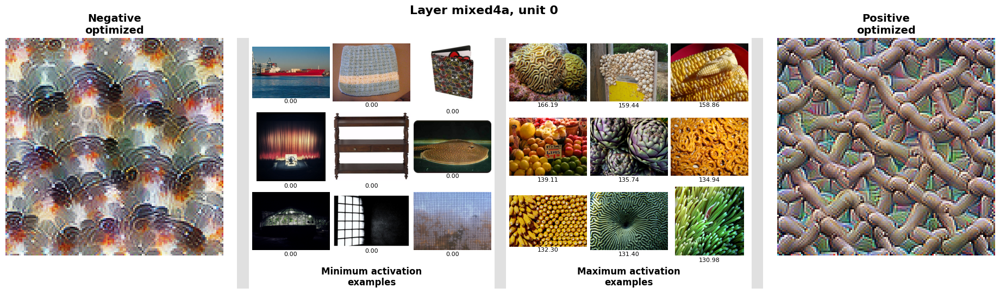

Saved Distill-style visualization for neuron 0


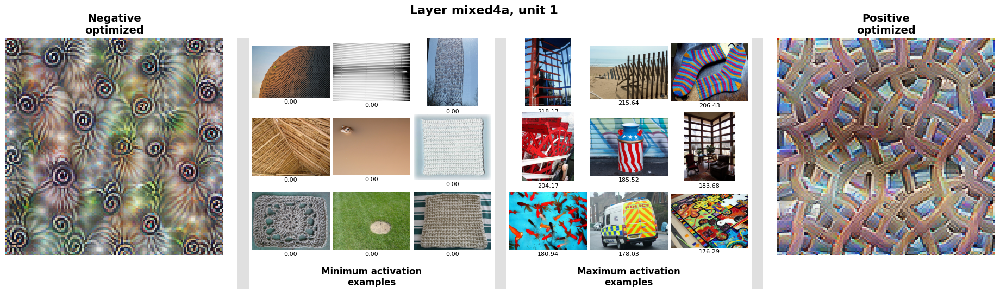

Saved Distill-style visualization for neuron 1


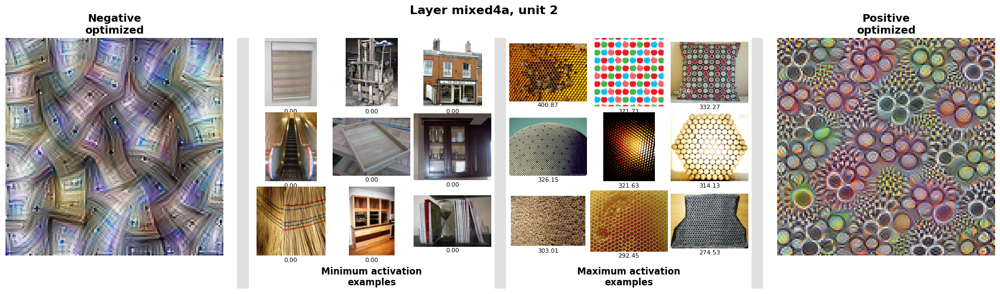

Saved Distill-style visualization for neuron 2


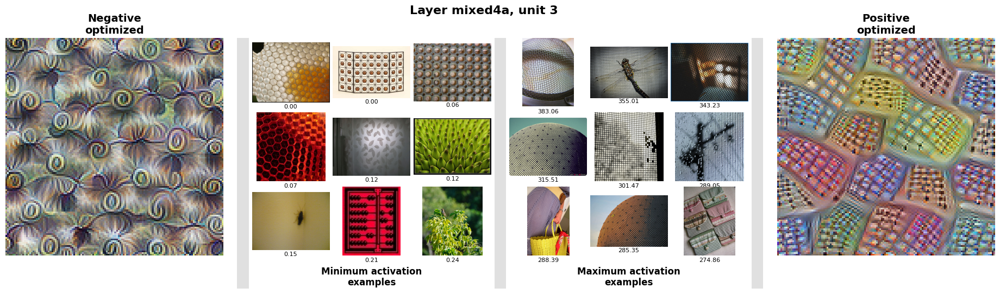

Saved Distill-style visualization for neuron 3


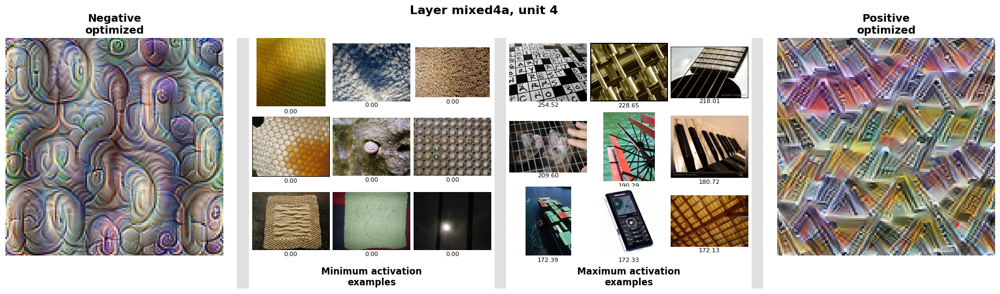

Saved Distill-style visualization for neuron 4


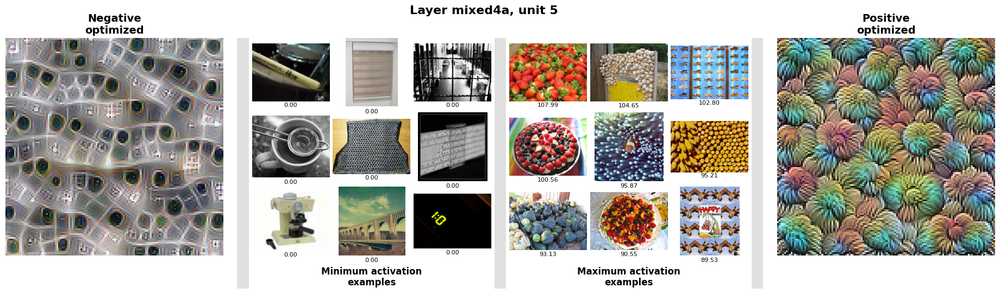

Saved Distill-style visualization for neuron 5


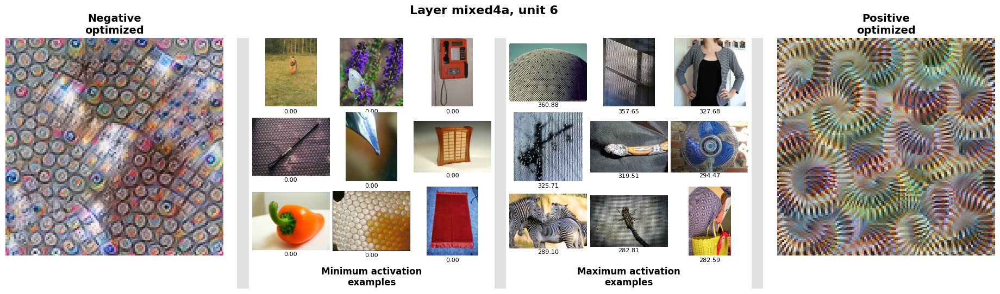

Saved Distill-style visualization for neuron 6


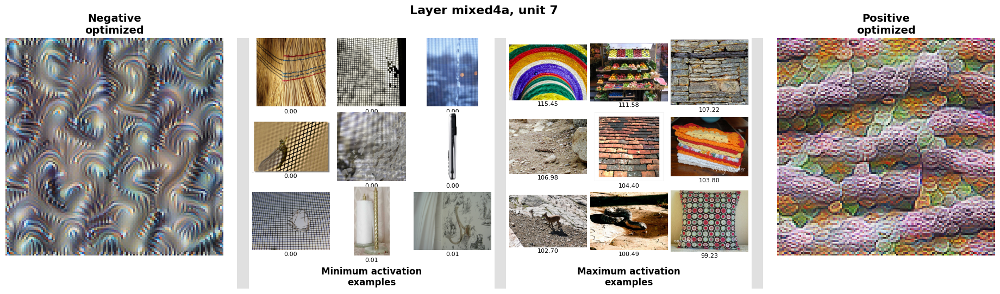

Saved Distill-style visualization for neuron 7


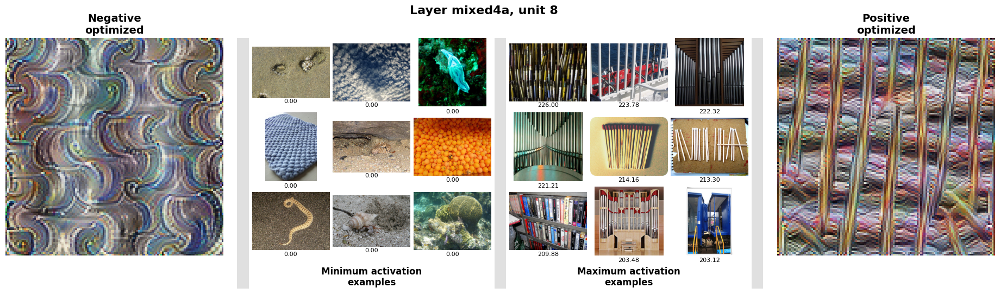

Saved Distill-style visualization for neuron 8


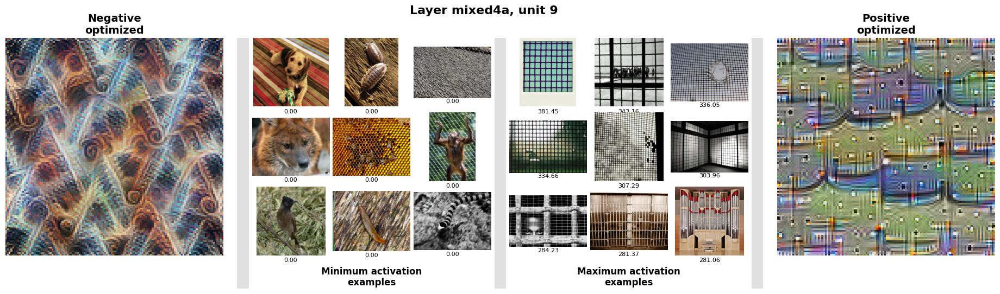

Saved Distill-style visualization for neuron 9

Done! Created Distill-style visualizations for each neuron.


In [26]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np

# ============================================================================
# VISUALIZATION: DISTILL-STYLE NEURON VISUALIZATION (REFACTORED)
# ============================================================================
print("Creating Distill-style visualizations...")

for neuron_idx in range(num_neurons):
    # ========================================================================
    # PRE-FETCH ALL IMAGES FOR THIS NEURON (cleaner approach)
    # ========================================================================
    max_images = get_top_images_for_neuron(neuron_idx, dataset, 'max')
    min_images = get_top_images_for_neuron(neuron_idx, dataset, 'min')

    # ========================================================================
    # CREATE FIGURE
    # ========================================================================
    fig = plt.figure(figsize=(24, 6))

    # Layout: NegOpt(3) | Sep | Min(3) | Sep | Max(3) | Sep | PosOpt(3)
    width_ratios = [1, 1, 1, 0.15,  # Neg Opt (0-2) + Sep1 (3)
                    1, 1, 1, 0.15,  # Minimum (4-6) + Sep2 (7)
                    1, 1, 1, 0.15,  # Maximum (8-10) + Sep3 (11)
                    1, 1, 1]        # Pos Opt (12-14)
    height_ratios = [1, 1, 1, 0.4]  # 3 image rows + 1 caption row
    gs = GridSpec(4, 15, figure=fig, wspace=0.05, hspace=0.1,
                 width_ratios=width_ratios, height_ratios=height_ratios)

    # Create separator axes (gray vertical bars)
    sep_color = '#E0E0E0'
    for sep_col in [3, 7, 11]:
        ax_sep = fig.add_subplot(gs[:, sep_col])
        ax_sep.set_facecolor(sep_color)
        ax_sep.set_xticks([])
        ax_sep.set_yticks([])
        for spine in ax_sep.spines.values():
            spine.set_visible(False)

    # ========================================================================
    # 1. NEGATIVE OPTIMIZED (if available)
    # ========================================================================
    ax_neg_opt = fig.add_subplot(gs[0:3, 0:3])
    ax_neg_opt.axis('off')

    if 'negative_optimizations' in globals() and neuron_idx < len(negative_optimizations):
        ax_neg_opt.imshow(negative_optimizations[neuron_idx])
        ax_neg_opt.set_title('Negative\noptimized', fontsize=14, fontweight='bold')
    else:
        ax_neg_opt.text(0.5, 0.5, 'No negative\noptimization',
                       ha='center', va='center', fontsize=12, color='gray')
        ax_neg_opt.set_title('Negative\noptimized', fontsize=14, fontweight='bold', color='gray')

    # ========================================================================
    # 2. MINIMUM ACTIVATION EXAMPLES (3x3 grid) - USING HELPER FUNCTION
    # ========================================================================
    for i in range(9):
        row, col = i // 3, i % 3
        ax = fig.add_subplot(gs[row, 4 + col])
        ax.axis('off')

        if i < len(min_images):
            ax.imshow(min_images[i]['image'])
            # Add activation value below image
            ax.text(0.5, -0.1, f"{min_images[i]['activation']:.2f}",
                   transform=ax.transAxes, fontsize=8, ha='center')
        else:
            # Empty slot
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center',
                   fontsize=10, color='lightgray')

    # Caption in 4th row
    ax_cap = fig.add_subplot(gs[3, 4:7])
    ax_cap.axis('off')
    ax_cap.text(0.5, 0.8, 'Minimum activation\nexamples',
                ha='center', va='top', fontsize=12, fontweight='bold')

    # ========================================================================
    # 3. MAXIMUM ACTIVATION EXAMPLES (3x3 grid) - USING HELPER FUNCTION
    # ========================================================================
    for i in range(9):
        row, col = i // 3, i % 3
        ax = fig.add_subplot(gs[row, 8 + col])
        ax.axis('off')

        if i < len(max_images):
            ax.imshow(max_images[i]['image'])
            # Add activation value below image
            ax.text(0.5, -0.1, f"{max_images[i]['activation']:.2f}",
                   transform=ax.transAxes, fontsize=8, ha='center')
        else:
            # Empty slot
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center',
                   fontsize=10, color='lightgray')

    # Caption in 4th row
    ax_cap = fig.add_subplot(gs[3, 8:11])
    ax_cap.axis('off')
    ax_cap.text(0.5, 0.8, 'Maximum activation\nexamples',
                ha='center', va='top', fontsize=12, fontweight='bold')

    # ========================================================================
    # 4. POSITIVE OPTIMIZED (if available)
    # ========================================================================
    ax_pos_opt = fig.add_subplot(gs[0:3, 12:15])
    ax_pos_opt.axis('off')

    if 'positive_optimizations' in globals() and neuron_idx < len(positive_optimizations):
        ax_pos_opt.imshow(positive_optimizations[neuron_idx])
        ax_pos_opt.set_title('Positive\noptimized', fontsize=14, fontweight='bold')
    else:
        ax_pos_opt.text(0.5, 0.5, 'No positive\noptimization',
                       ha='center', va='center', fontsize=12, color='gray')
        ax_pos_opt.set_title('Positive\noptimized', fontsize=14, fontweight='bold', color='gray')

    # ========================================================================
    # FIGURE TITLE AND LAYOUT
    # ========================================================================
    fig.suptitle(
        f"Layer mixed4a, unit {neuron_idx}",
        fontsize=16,
        fontweight='bold',
        y=0.98
    )

    fig.tight_layout(rect=[0, 0, 1, 0.96])

    # Save individual neuron visualization
    plt.savefig(f'mixed4a_neuron_{neuron_idx}_distill_style.png',
                dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()

    print(f"Saved Distill-style visualization for neuron {neuron_idx}")

print("\nDone! Created Distill-style visualizations for each neuron.")

**Summary of Findings: Feature Analysis of InceptionV1 Mixed4a Layer**

**Key Observations by Neuron**
**Unit 0:** **Repetitive Circular/Organic Patterns**
Maximum activations: Honeycomb structures, coral patterns, pasta arrangements, and clustered organic forms (activation range: ~130-166)

**Interpretation: **This neuron responds strongly to densely packed circular or hexagonal patterns, particularly those found in natural structures (honeycombs, coral) and food arrangements. The feature appears to detect repetitive organic tessellations.

**Minimum activations:** Flat textures, solid surfaces, minimal structure (activations near 0.0)

**Unit 1: Diagonal Lines and Lattice Structures**
**Maximum activations:** Fences, architectural grids, striped patterns, lattice structures (activation range: ~176-218)

**Interpretation:** Strong detector for diagonal linear patterns and grid-like structures. Responds to both natural (fence posts) and architectural elements with prominent angular lines. The neuron appears orientation-selective for diagonal/lattice arrangements.

**Minimum activations:** Smooth textures, fabrics, organic surfaces

**Unit 2:** Circular Dots and Regular Arrays
**Maximum activations:** Polka dots, button arrays, honeycomb cross-sections, perforated materials (activation range: ~274-400)

**Interpretation:** Highly specialized for circular dot patterns and regular hexagonal arrays. Shows strongest response among all analyzed neurons (activation up to 400), suggesting this is a fundamental feature detector for dotted/spotted textures.

**Minimum activations:** Architectural interiors, wooden textures, plain surfaces

**Unit 4:** Grid Patterns and Crosshatching
**Maximum activations:** Crossword puzzles, guitar frets, grid overlays, tiled patterns (activation range: ~172-254)

**Interpretation:** Detects orthogonal grid structures and crosshatch patterns. Unlike Unit 1 (diagonal), this neuron prefers perpendicular intersections. Responds to both fine grids (puzzles) and coarser architectural elements.

**Minimum activations:** Organic textures (honeycomb, scales, fabric)

**Unit 5:** Dense Clustering and Repetitive Objects
**Maximum activations:** Fruit/vegetable displays, clustered candies, repetitive small objects (activation range: ~89-107)

**Interpretation:** Responds to densely packed collections of similar objects. Strong activation for produce displays, candy arrays, and repeated items. May be detecting "abundance" or "collection" patterns rather than specific object types.

**Minimum activations:** Mechanical objects, smooth surfaces, monochromatic scenes

**Unit 6:** Fine Mesh and Regular Grids
**Maximum activations:** Wire mesh, perforated metal, screen doors, fine grid patterns (activation range: ~282-357)

**Interpretation:** Specialized for fine-scale regular grids and mesh patterns. Distinguishable from Unit 4 by preferring finer, more uniform spacing. High activation values suggest this is a salient feature in the network's hierarchy.

**Minimum activations:** Natural scenes, flowers, smooth objects

**Unit 7:** Layered Patterns and Stacked Structures
Maximum activations: Rainbows, stacked produce, brick walls, layered foods (activation range: ~99-115)

**Interpretation:** Detects horizontal layering and stacked parallel structures. Responds to both natural (rainbows, geological layers) and artificial (bricks, shelves) stratified patterns. Color transitions may enhance response.

**Minimum activations:** Grid patterns, plain textures, single-layer surfaces

**Unit 8:** Vertical Linear Structures
**Maximum activations:** Organ pipes, vertical blinds, columnar arrangements, parallel vertical lines (activation range: ~203-226)

**Interpretation:** Strong orientation selectivity for vertical parallel lines. Complementary to Unit 1 (diagonal) and Unit 4 (orthogonal grids). Architectural and musical instrument components dominate maximum activations.

*+Minimum activations:** Natural scenes, animals, scattered objects

**Unit 9:** Regular Grid Patterns (High Activation)
Maximum activations: Window grids, architectural screens, mesh patterns (activation range: ~281-381)

**Interpretation:** Another grid detector but with higher activation magnitudes than Units 4 and 6. May represent a higher-order or more confident grid detection. Responds particularly strongly to architectural gridwork with strong contrast.

**Minimum activations:** Animals, natural organic textures

**Cross-Neuron Patterns**
**Feature Hierarchy**
**Low-level geometric features:** Multiple neurons (1, 4, 6, 8, 9) detect oriented lines and grids at different scales and orientations

**Mid-level pattern features:** Units 0, 2, 5 detect repetitive arrangements (circles, dots, clusters)

**Complex structural features:** Unit 7 detects layered compositions requiring integration across larger spatial scales

**Activation Magnitude Observations**
**Highest activations:** Unit 2 (circular dots, ~400) and Unit 9 (grids, ~381)

**Lowest maximum activations:** Unit 7 (layered patterns, ~115) and Unit 5 (clusters, ~107)

**Minimum activations:** Nearly all units show activations near 0.0 for non-preferred stimuli, consistent with ReLU activation functions

**Feature Selectivity**
Highly specific: Units 2 (dots), 7 (layers), 8 (vertical lines) show narrow selectivity

**Broader tuning:** Units 0 (organic patterns) and 5 (clusters) respond to more diverse stimuli

**Complementary orientation selectivity:** Units 1 (diagonal), 4 (orthogonal), 8 (vertical) tile orientation space



In [27]:
# ============================================================================
# OPTIONAL: Create a summary visualization for multiple neurons
# ============================================================================
def create_summary_visualization(neuron_indices, dataset, save_path='neuron_summary.png'):
    """
    Create a compact summary showing multiple neurons in one figure.
    Only shows max activation examples.
    """
    n_neurons = len(neuron_indices)
    fig, axes = plt.subplots(n_neurons, 5, figsize=(15, 3 * n_neurons))

    if n_neurons == 1:
        axes = axes.reshape(1, -1)

    for i, neuron_idx in enumerate(neuron_indices):
        # Use helper function to get images
        max_images = get_top_images_for_neuron(neuron_idx, dataset, 'max')

        # Show top 5 max activations
        for j in range(5):
            ax = axes[i, j]
            ax.axis('off')

            if j < len(max_images):
                ax.imshow(max_images[j]['image'])
                ax.set_title(f"{max_images[j]['activation']:.2f}", fontsize=9)

            if j == 0:
                ax.set_ylabel(f'Neuron {neuron_idx}', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()
    print(f"Saved summary visualization to {save_path}")

# Example: Create summary for first 10 neurons
create_summary_visualization(list(range(10)), dataset)


Saved summary visualization to neuron_summary.png


In [29]:
print("\nSaving results...")
results = {
    'dataset_exemplars': {}
}

for neuron_idx in range(num_neurons):
    # Extract from final_max_activations and final_min_activations
    # Remember: tuples are (activation_val, img_id, img)

    max_data = [
        {'image_index': img_id, 'activation': float(activation_val)}
        for activation_val, img_id, img in final_max_activations[neuron_idx]
    ]

    min_data = [
        {'image_index': img_id, 'activation': float(activation_val)}
        for activation_val, img_id, img in final_min_activations[neuron_idx]
    ]

    results['dataset_exemplars'][f'neuron_{neuron_idx}'] = {
        'maximum_activating': max_data,
        'minimum_activating': min_data
    }

import json
with open('mixed4a_comprehensive_results.json', 'w') as f:
    json.dump(results, f, indent=2)

print("Done! Results saved to mixed4a_comprehensive_results.json")



Saving results...
Done! Results saved to mixed4a_comprehensive_results.json


# Interpretability Insights

**What Mixed4a Represents**
The mixed4a layer in InceptionV1 encodes mid-level visual features that bridge low-level edges (from earlier layers) and high-level object parts (in later layers). These neurons act as texture and pattern detectors rather than object-specific features.

**Design Implications**
The prevalence of grid, line, and repetitive pattern detectors suggests that:

**Natural and architectural regularities** are fundamental to the network's visual representation

The inception module's multi-scale receptive fields enable detection of patterns at varying spatial frequencies

The network dedicates multiple neurons to similar features (grids, lines) at different scales/orientations, providing robustness

**Methodology Validation**
**Minimum Activations (Near-Zero)**
The consistent near-zero minimum activations across all neurons validate our approach:

ReLU non-linearity enforces non-negative outputs

Neurons genuinely "ignore" non-preferred features rather than showing negative responses

Minimum examples confirm feature selectivity by showing what neurons don't respond to

**Positive Optimization Coherence**
The feature-optimized images (right column) align well with dataset examples:

Unit 2 optimization shows circular/hexagonal patterns matching dot-detection interpretation

Unit 8 optimization displays vertical striations consistent with organ pipe activations

Unit 9 optimization reveals grid structures matching architectural examples

This coherence suggests our dataset exemplars accurately represent learned features rather than spurious correlations.

# Conclusion

The first 10 neurons of InceptionV1's mixed4a layer implement a texture and pattern vocabulary focused on geometric regularities: grids, lines, circles, and repetitive structures. These features are:

Orientation-selective (diagonal, vertical, orthogonal)

Scale-selective (fine vs. coarse grids)

Pattern-selective (dots, layers, clusters)

This analysis demonstrates that deep networks learn interpretable, compositional features aligned with fundamental properties of natural and artificial visual environments. The findings support the use of dataset exemplars as a primary tool for neural network interpretability research.